# Season Image Classifier
---

This Season Image Classifier was inspired by a Day and Night Image Classifier project as part of [Udacity's Computer Vision Nanodegree]() training.

**Dataset**

The dataset consists of [280] RGB color images split into two directories and four categories each (spring, summer, fall, and winter):

    img_train: 200 images for training (50 of each season)
    img_test: 80 images for testing (20 of each season)
    
The initial goal of this project is to build a classifier that can accurately label these images based on the season in which they were taken. This relies on finding distinguishing features between the different types of images.

*Note: I'm trying to collect images from the [AMOS dataset](http://cs.uky.edu/~jacobs/datasets/amos/) (Archive of Many Outdoor Scenes), but at the moment, I'm using CC0 images collected from [Pexels](https://pexels.com).*

### Import resources

In [1]:
import cv2
import helpers # helper functions for loading the data, pre-processing images, and so on.

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

ModuleNotFoundError: No module named 'cv2'

In [61]:
# Image data directories
img_train = "img/train/"
img_test = "img/test/"

---
# 1. Load the datasets

First, we load in the training images and store them in a variable called, `IMG_LIST`.

In [62]:
# Helper functions
import os 
import glob # library for loading images from a directory

def load_data(image_directory):
    # Populate this empty image list
    im_list = []
    im_types = ["winter", "spring", "summer", "fall"]
    
    # Iterate through each color folder
    for im_type in im_types:
        
        # Iterate through each file in each image_type folder
        # glob reads in any image with the ext "image_directory/im_type/*"
        for file in glob.glob(os.path.join(image_directory, im_type, "*")):
            
            # Read in the image
            im = mpimg.imread(file)
            
            # Check if the image exists / if it's been correctly read in
            if not im is None:
                # Append the image, and its type (winter, spring, summer, fall) to the image list
                im_list.append((im, im_type))
                
    return im_list

In [63]:
# Using the load_dataset function from above (helpers.py not working well)
# Load training data
IMG_LIST = load_data(img_train)
# im = mpimg.imread('/Users/aaronkr/Desktop/Dev/Python/learning-opencv/img-classifier/img/train/fall/pexels-photo-695207.jpeg')

### Visualize the input images

Shape: (625, 500, 3)
Label: winter


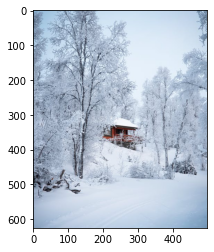

In [64]:
# Select an image and its label by list index
img_idx = 10
selected_img = IMG_LIST[img_idx][0]
selected_lbl = IMG_LIST[img_idx][1]

print("Shape: " + str(selected_img.shape))
print("Label: " + selected_lbl)

# Show selected sample image
plt.imshow(selected_img)

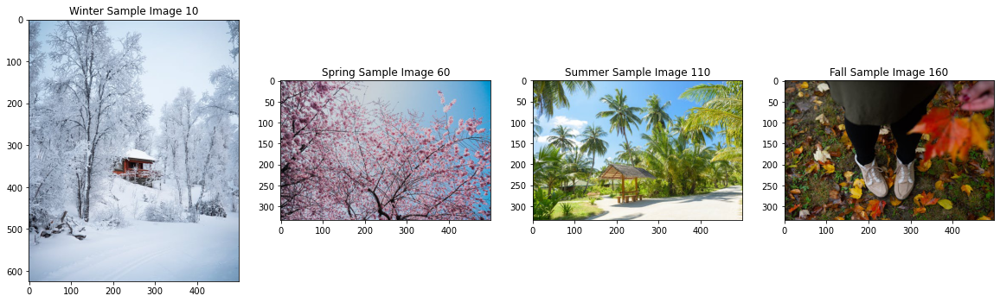

In [217]:
def sample_imgs(index, img_list = STD_LIST):
    # Plot four images, one from each season
    
    offset = 50 # We assume each season's offset is 50 because that's the total size each season's dataset
    
    wn_idx = index
    sp_idx = index + offset
    sm_idx = index + offset * 2
    fl_idx = index + offset * 3
    
    if img_list is not None:
        f, (win, spr, smr, fll) = plt.subplots(1, 4, figsize = (20, 10))
        win.set_title('Winter Sample Image {}'.format(index))
        win.imshow(img_list[wn_idx][0])
        spr.set_title('Spring Sample Image {}'.format(index + offset))
        spr.imshow(img_list[sp_idx][0])
        smr.set_title('Summer Sample Image {}'.format(index + offset * 2))
        smr.imshow(img_list[sm_idx][0])
        fll.set_title('Fall Sample Image {}'.format(index + offset * 3))
        fll.imshow(img_list[fl_idx][0])
        
sample_imgs(10, IMG_LIST)

---
# 2. Pre-process the data

### Standardize input

We need to resize each image to the desired input size: (hxw)

In [202]:
# Standardize the RGB image size
def standardize_input(image, output_size):
    """Standardize the image input by pre-processing the data.
        
    Args:
        image: The image to standardize.
        output_size (tuple or int): Desired output size. If tuple, output is 
            matched to output_size. If int, smaller of image edges is matched
            to output_size, keeping aspect ratio the same.
    """
    
    ## 1. Resize the image
    h, w = image.shape[:2]
    if isinstance(output_size, int):
        if h > w:
            new_h, new_w = output_size * h / w, output_size
        else:
            new_h, new_w = output_size, output_size * w / h
    else:
        new_h, new_w = output_size
        
    new_h, new_w = int(new_h), int(new_w)
    
    # This only proportionally resizes the image, but doesn't crop it
    std_img = cv2.resize(image, (new_w, new_h))
    
    
    ## 2. Center crop the image to a square shape
    h, w = std_img.shape[:2]
    if h > output_size:
        top = int((h - output_size) / 2)
        crop_img = std_img[top:new_h-top, 0:new_w]
    else:
        left = int((w - output_size) / 2)
        crop_img = std_img[0:new_h, left:new_w-left]
    
    return crop_img

### Standardize output

There are three ways we can categorize images:

1. Categorical (`winter, spring, summer, fall`)
2. Integer encoding (`0 = winter, 1 = spring, 2 = summer, 3 = fall`)
3. One-hot encoding (`winter = [1,0,0,0], spring = [0,1,0,0], summer = [0,0,1,0], fall = [0,0,0,1]`)

In [203]:
# Standardize the labels
def standardize_output(label):
    
    # Integer encoding
    int_val = 0
    
    if label == 'spring':
        int_val = 1
    elif label == 'summer':
        int_val = 2
    elif label == 'fall':
        int_val = 3
    # else it's winter, and remains 0
    
    return int_val

### Standardize `IMG_LIST`

Construct a `STD_LIST` of input images and output labels.

In [204]:
def standardize_list(img_list):
    
    # Empty image data array
    std_list = []
    
    # Iterate through all image-label pairs
    for pair in img_list:
        img = pair[0]
        lbl = pair[1]
        
        # Standardize the image
        std_img = standardize_input(img, 96)
        
        # Standardize the label
        std_lbl = standardize_output(lbl)
        
        # Append img and encoded label to the full, processed list of image data
        std_list.append((std_img, std_lbl))
        
    return std_list

# Standardize all training images
STD_LIST = standardize_list(IMG_LIST)

### Visualize the standardized data

Standard Shape: (96, 96, 3)
Standard Label [0 = winter, 1 = spring, 2 = summer, 3 = fall]: 0


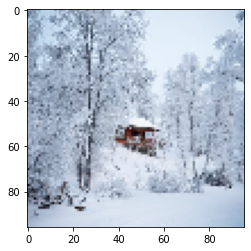

In [218]:
# Display a STD_LIST image and label

# Select an image and its label by list index
img_idx = 10
selected_std_img = STD_LIST[img_idx][0]
selected_std_lbl = STD_LIST[img_idx][1]

print("Standard Shape: " + str(selected_std_img.shape))
print("Standard Label [0 = winter, 1 = spring, 2 = summer, 3 = fall]: " + str(selected_std_lbl))

# Show selected sample image
plt.imshow(selected_std_img)

### Multiple samples

I want to check multiple samples to try and notice some patterns. So, let's display 4 rows of images from each season. Column 1 will contain winter images, Column 2 is spring, Column 3 is summer, and Column 4 is fall images. And let's turn this into a function so we can do it again later with another set of images.

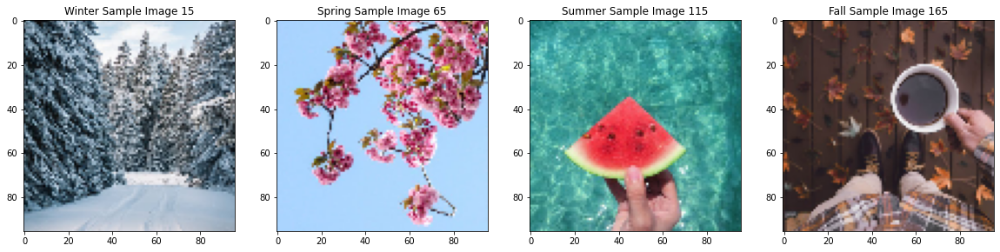

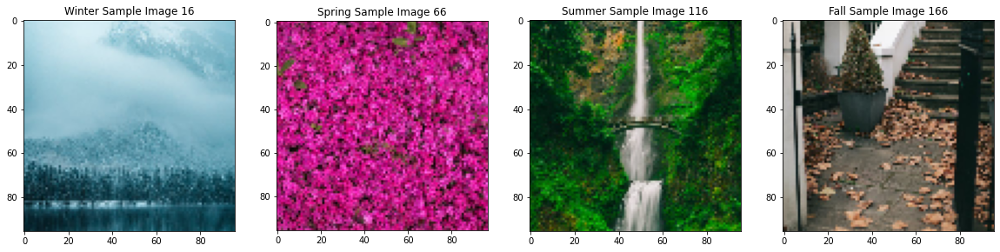

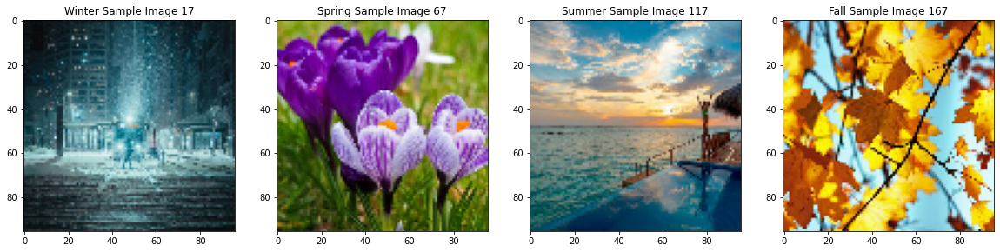

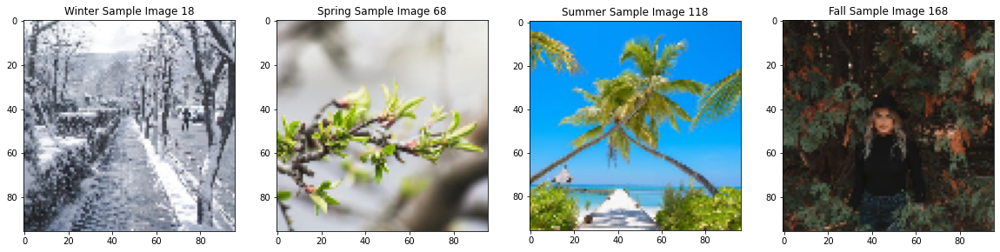

In [220]:
# Actually, let's display a 4x4 grid of images by season
# What kinds of patterns can we see here?
def display_image_grid(index):
    for i in range(index, index + 4):
        # Display one of each season's images using the function we defined earlier
        sample_imgs(i, STD_LIST)
        
display_image_grid(15)

---
# 3. Feature Extraction: Average Brightness

To extract the **average brightness** of an image, we use the HSV colorspace, specifically the *V* (value) channel as the measure of brightness.

1. Convert to HSV colorspace
2. Add up the pixel values in the V channel
3. Divide that sum by the area of the image to get the average brightness of the image

### RGB to HSV conversion

First, let's visualize the RGB channels, then we can convert to HSV.

Label: 0


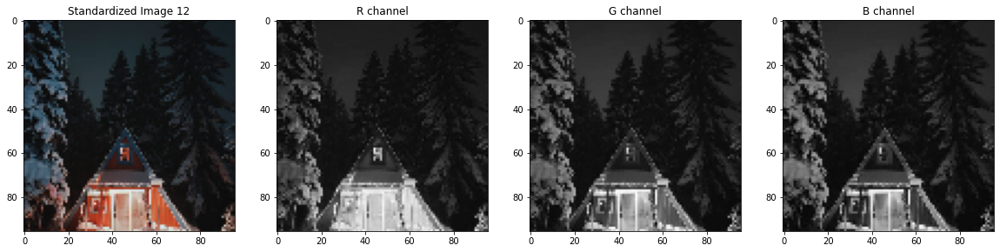

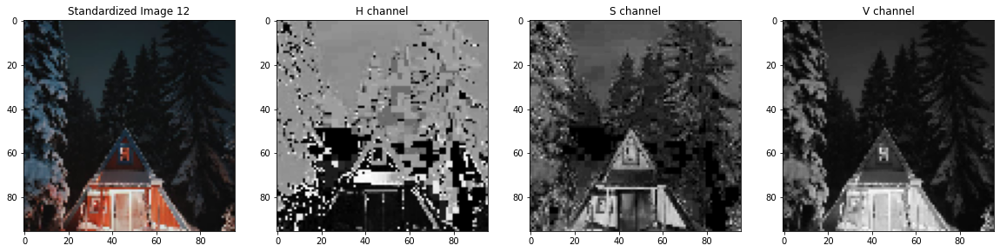

In [242]:
# Convert img to HSV colorspace and visualize the individual color channels
img_idx = 12
test_img = STD_LIST[img_idx][0]
test_lbl = STD_LIST[img_idx][1]

# RGB
r = test_img[:,:,0]
g = test_img[:,:,1]
b = test_img[:,:,2]

# Plot original image and the three channels
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (20, 10))
ax1.set_title('Standardized Image {}'.format(img_idx))
ax1.imshow(test_img)
ax2.set_title('R channel')
ax2.imshow(r, cmap = 'gray')
ax3.set_title('G channel')
ax3.imshow(g, cmap = 'gray')
ax4.set_title('B channel')
ax4.imshow(b, cmap = 'gray')

# Convert to HSV
hsv = cv2.cvtColor(test_img, cv2.COLOR_RGB2HSV)

# Print label
print('Label: ' + str(test_lbl))

# HSV Channels
h = hsv[:,:,0]
s = hsv[:,:,1]
v = hsv[:,:,2]

# Plot original image and the three channels
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (20, 10))
ax1.set_title('Standardized Image {}'.format(img_idx))
ax1.imshow(test_img)
ax2.set_title('H channel')
ax2.imshow(h, cmap = 'gray')
ax3.set_title('S channel')
ax3.imshow(s, cmap = 'gray')
ax4.set_title('V channel')
ax4.imshow(v, cmap = 'gray')

### Find average brightness of the V channel

In [74]:
# Find average Value (brightness) of an image
def avg_brightness(rgb_img):
    
    # Convert to HSV
    hsv = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)
    
    # Add up all pixel values in the V channel
    sum_brightness = np.sum(hsv[:,:,2])
    area = 96 * 96
    
    avg = sum_brightness / area
    
    return avg

# Later we can define a threshold value for the brightness (and probably colors) that will help us classify things.

### Visualize the data (average brightness)

Avg brightness: 54.497395833333336


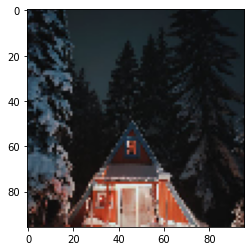

In [223]:
# Display a STD_LIST image and label

# Select an image and its label by list index
img_idx = 12
selected_std_img = STD_LIST[img_idx][0]
selected_std_lbl = STD_LIST[img_idx][1]

avg = avg_brightness(selected_std_img)

# print("Standard Shape: ", selected_std_img.shape)
# print("Standard Label [0 = spring, 1 = summer, 2 = fall, 3 = winter]: ", selected_std_lbl)
print("Avg brightness: " + str(avg))

## TODO: Display one image of each season in a plt.figure()
plt.imshow(selected_std_img)

---
# 4. Feature Extraction: Colors

Actually, we need to consider multiple color spaces in order to detect patterns in these images so that we can attempt to classify them correctly. So, let's take a look at some of these color spaces, what they mean, and how they are used.

| Color space | CV Code | Channel 1 | Channel 2 | Channel 3 | Notes | 
|:-:|:-:|:--|:--|:--|:--|
| XYZ | `33` | X = mix of three CIE RGB curves chosen to be non-negative | Y = Luminance | Z = Quasi-equal to blue | (CIE 1931) Widely used in scientific work |
| YCrCb | `37` | Y = Luminance | Cr = Red-difference chroma | Cb = Blue-difference chroma | similar to YUV |
| HSV | `41` | H = Hue (color value) | S = Saturation | V = Value (brightness, max value = intense color, min value = black) | similar to HSL |
| Lab | `44` | L = Perceptual Lightness | a = color axis relative to green-red | b = color axis relative to blue-yellow | similar to Luv |
| Luv | `51` | L = Luminance / lightness | u = green/red axes colors | v = blue/yellow axes colors | (CIE 1976) Widely used in computer graphics dealing with colored lights (also pedestrian, building, etc detection) similar to Lab |
| HLS | `53` | H = Hue (color value) | S = Saturation | L = Lightness (max value = white) | similar to HSV |
| YUV | `83` | Y = Luma component | U = Blue projection chroma | V = Red projection chroma | similar to YCrCb |

### RGB to other color spaces conversion

Let's create a function to handle multiple conversions and print images from each season with conversions. Then, we'll compare the differences between some of the more similar color spaces in order to choose the ones we want to focus on.

In [266]:
def get_channel_avg(channel):
    # Add up all pixel values in the V channel
    channel_sum = np.sum(channel)
    area = 96 * 96
    
    avg = channel_sum / area
    
    return avg

In [267]:
def cvt_sample_imgs(index, conversion, img_list = STD_LIST):
    # Convert img to YCrCb colorspace and visualize the individual color channels
    test_img = img_list[index][0]
    test_lbl = img_list[index][1]
    
    """A few colorspace conversion codes:
    https://docs.opencv.org/3.4/d8/d01/group__imgproc__color__conversions.html#ga4e0972be5de079fed4e3a10e24ef5ef0
    
    cv2.COLOR_RGB2GRAY = 7, # too many indices
    cv2.COLOR_RGB2XYZ = 33,
    cv2.COLOR_RGB2YCrCb = 37,
    cv2.COLOR_RGB2HSV = 41,
    cv2.COLOR_RGB2Lab = 44,
    cv2.COLOR_RGB2Luv = 51,
    cv2.COLOR_RGB2HLS = 53,
    cv2.COLOR_RGB2YUV = 83,
    """

    if conversion != 0: # if 0, let's keep it as an RGB image
        # Convert to the colorspace we want
        converted = cv2.cvtColor(test_img, conversion)
    else:
        converted = test_img

    # Channels
    zero = converted[:,:,0]
    one = converted[:,:,1]
    two = converted[:,:,2]
    
    # Color channel labels
    color_channel_labels = []
    
    if conversion == 0:
        color_channel_labels = ['R','G','B']
    elif conversion == 7: # Gray (not implemented right now, because technically only 1 color channel)
        color_channel_labels = ['','','']
    elif conversion == 33: # XYZ
        color_channel_labels = ['X','Y','Z']
    elif conversion == 37: # YCrCb
        color_channel_labels = ['Y','Cr','Cb']
    elif conversion == 41: # HSV
        color_channel_labels = ['H','S','V']
    elif conversion == 44: # Lab
        color_channel_labels = ['L','a','b']
    elif conversion == 51: # Luv
        color_channel_labels = ['L','u','v']
    elif conversion == 53: # HLS
        color_channel_labels = ['H','L','S']
    elif conversion == 83: # YUV
        color_channel_labels = ['Y','U','V']

    # Plot original images and the three channels
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (20, 10))
    ax1.set_title('Standardized Image {}'.format(index))
    ax1.imshow(test_img)
    ax2.set_title('{} Channel avg = {}'.format(color_channel_labels[0], get_channel_avg(zero)))
    ax2.imshow(zero, cmap = 'gray')
    ax3.set_title('{} Channel avg = {}'.format(color_channel_labels[1], get_channel_avg(one)))
    ax3.imshow(one, cmap = 'gray')
    ax4.set_title('{} Channel avg = {}'.format(color_channel_labels[2], get_channel_avg(two)))
    ax4.imshow(two, cmap = 'gray')

### HSV vs HSL

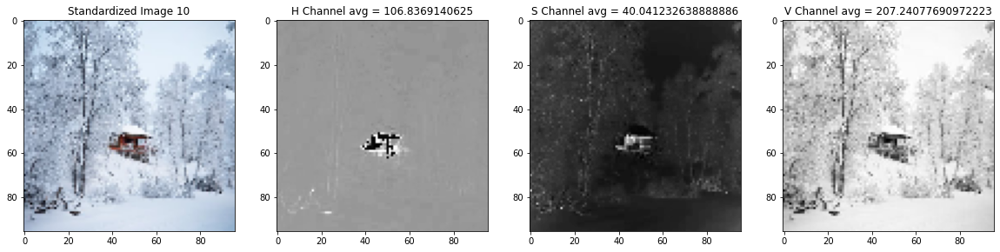

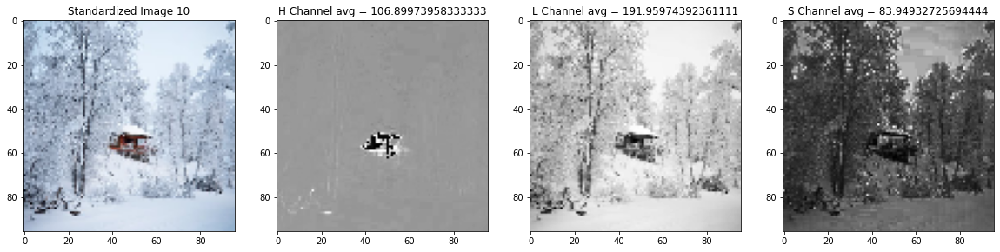

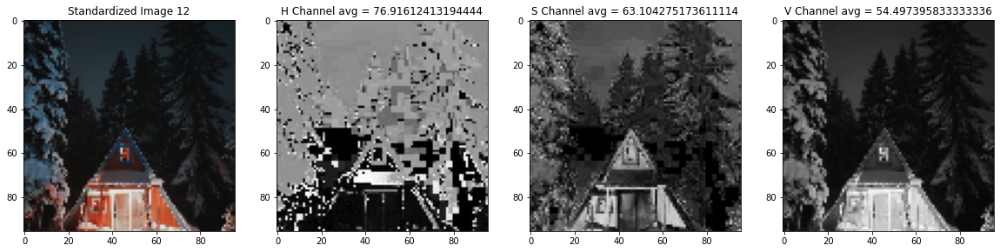

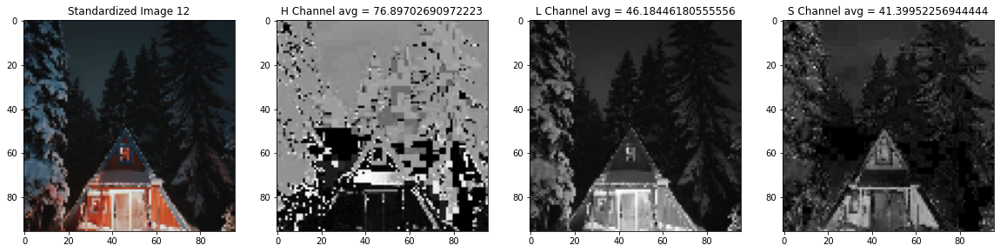

In [268]:
# one source of truth for our image choice
img_choice = 10 # day image

cvt_sample_imgs(img_choice, 41) # HSV
cvt_sample_imgs(img_choice, 53) # HLS

img_choice = 12 # night image

cvt_sample_imgs(img_choice, 41) # HSV
cvt_sample_imgs(img_choice, 53) # HLS

### YCrCb vs YUV

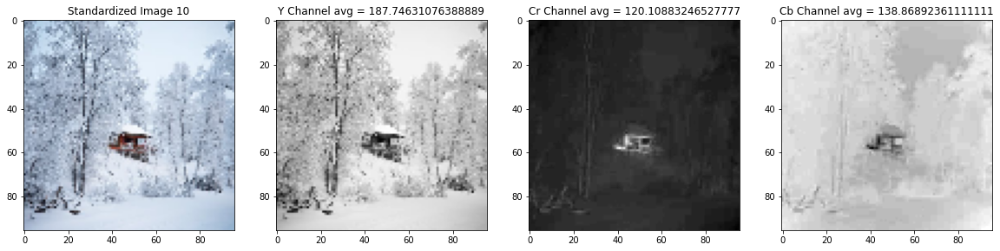

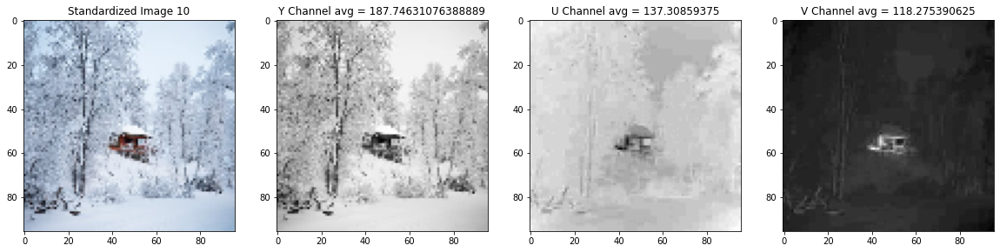

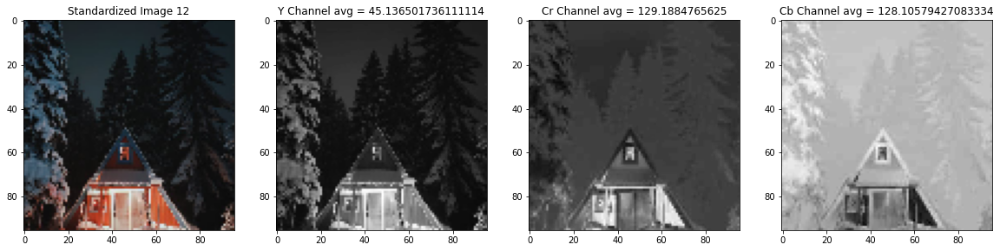

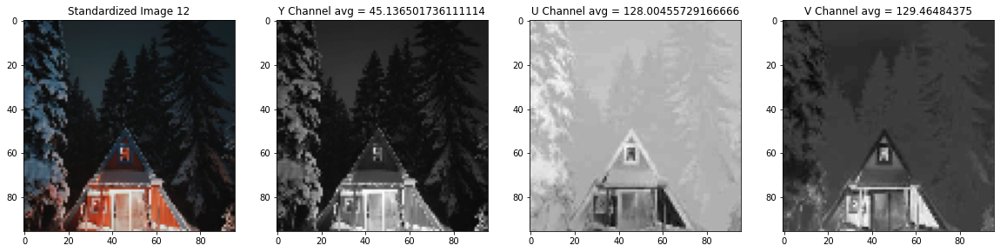

In [269]:
# one source of truth for our image choice
img_choice = 10 # day image

cvt_sample_imgs(img_choice, 37) # YCrCb
cvt_sample_imgs(img_choice, 83) # YUV

# one source of truth for our image choice
img_choice = 12 # night image

cvt_sample_imgs(img_choice, 37) # YCrCb
cvt_sample_imgs(img_choice, 83) # YUV

### Lab vs Luv

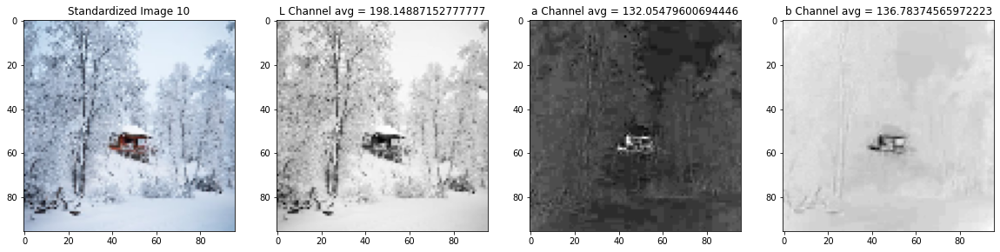

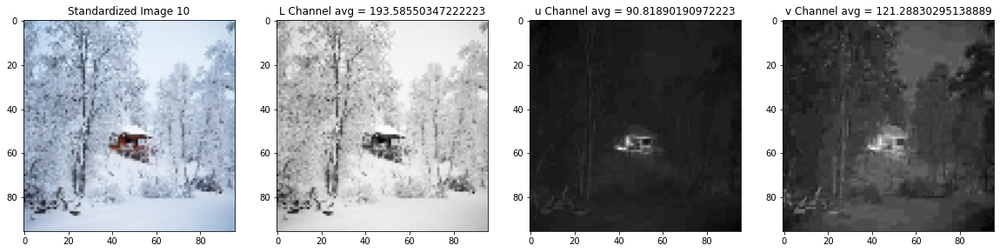

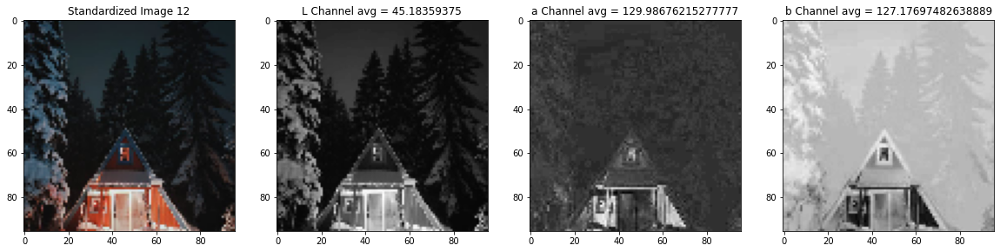

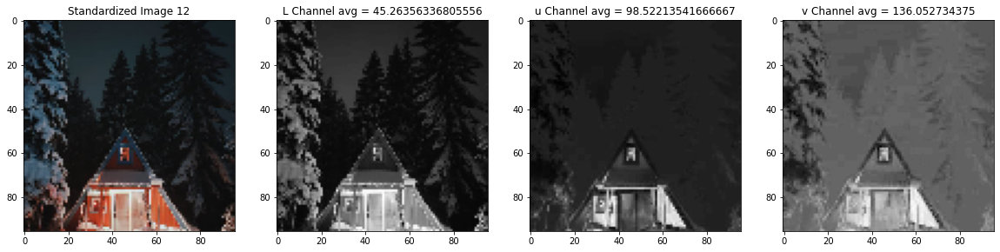

In [260]:
# one source of truth for our image choice
img_choice = 10 # day image

cvt_sample_imgs(img_choice, 44) # Lab
cvt_sample_imgs(img_choice, 51) # Luv

# one source of truth for our image choice
img_choice = 12 # night image

cvt_sample_imgs(img_choice, 44) # Lab
cvt_sample_imgs(img_choice, 51) # Luv

### XYZ vs Luv

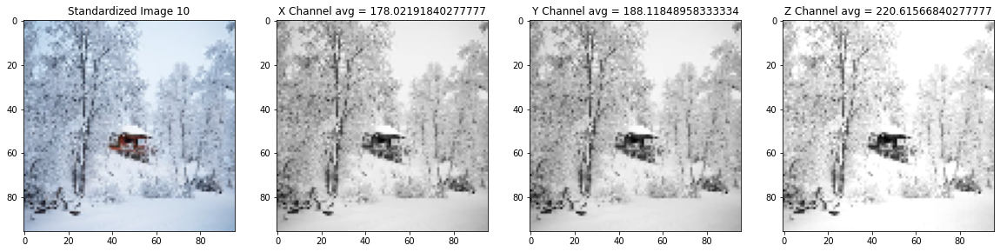

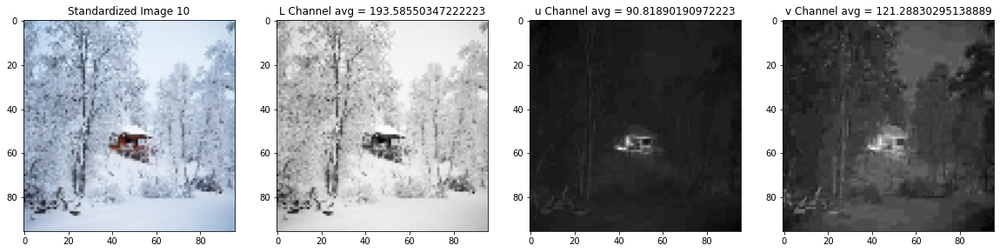

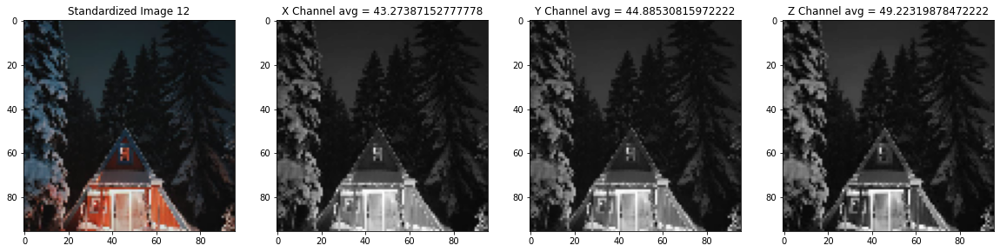

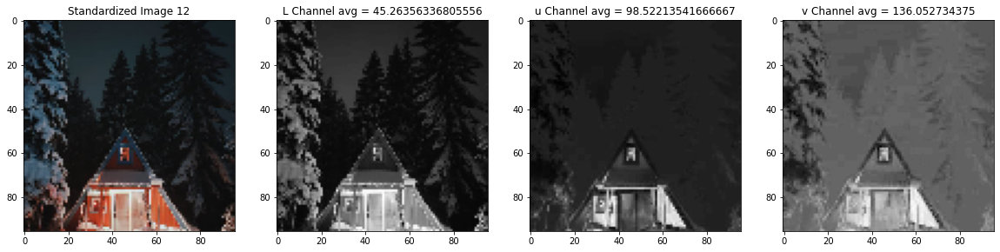

In [261]:
# one source of truth for our image choice
img_choice = 10 # day image

cvt_sample_imgs(img_choice, 33) # XYZ
cvt_sample_imgs(img_choice, 51) # Luv

# one source of truth for our image choice
img_choice = 12 # night image

cvt_sample_imgs(img_choice, 33) # XYZ
cvt_sample_imgs(img_choice, 51) # Luv

### XYZ vs RGB

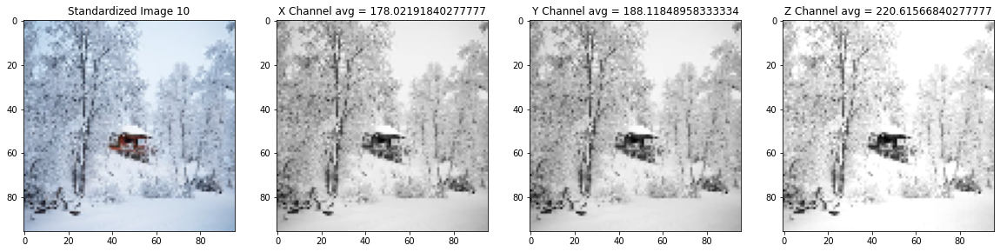

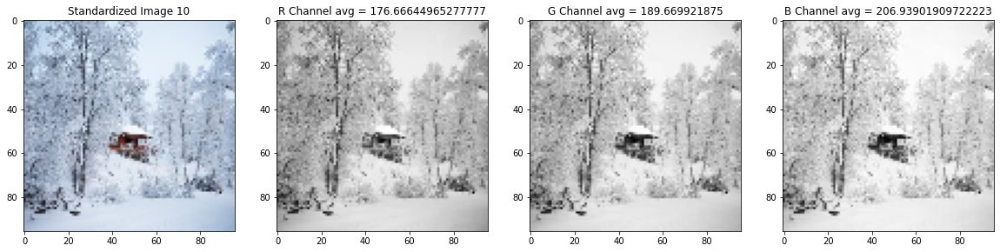

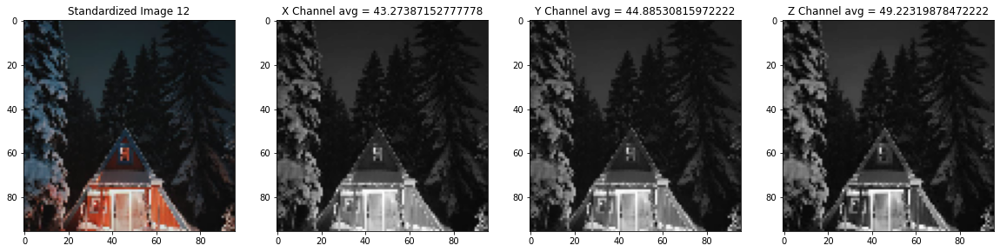

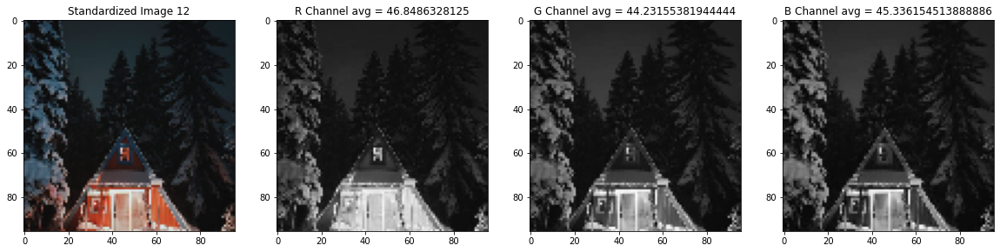

In [262]:
# one source of truth for our image choice
img_choice = 10 # day image

cvt_sample_imgs(img_choice, 33) # XYZ
cvt_sample_imgs(img_choice, 0) # RGB

# one source of truth for our image choice
img_choice = 12 # night image

cvt_sample_imgs(img_choice, 33) # XYZ
cvt_sample_imgs(img_choice, 0) # RGB

### Check a color space for each season

Color spaces:

* `0` = RGB (not a color code, but conditionally handled in the function) #4
* `33` = XYZ (not great)
* `37` = YCrCb
* `41` = HSV (choice over HLS) #1
* `44` = Lab (good one) #2
* `51` = Luv (so-so)
* `53` = HLS
* `83` = YUV (choice over YCrCb) #3

#### Color space choices:

1. `HSV` : particularly for H = Hue, and V = Value (brightness)
2. `Lab` : a = green/red axes, b = blue/yellow axes
3. `YUV` : U = blue, V = red (opposite Lab)
4. `RGB` : R = red, G = green (handled with a in Lab), B = blue

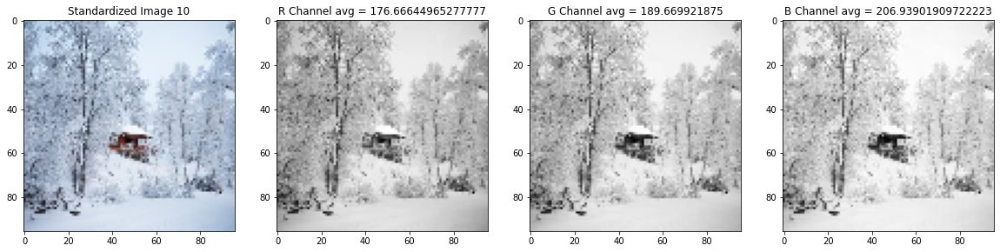

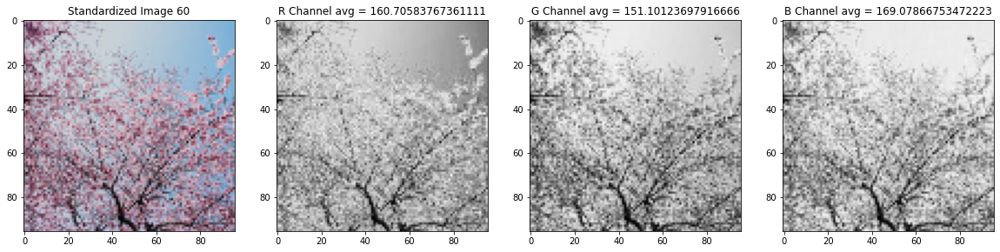

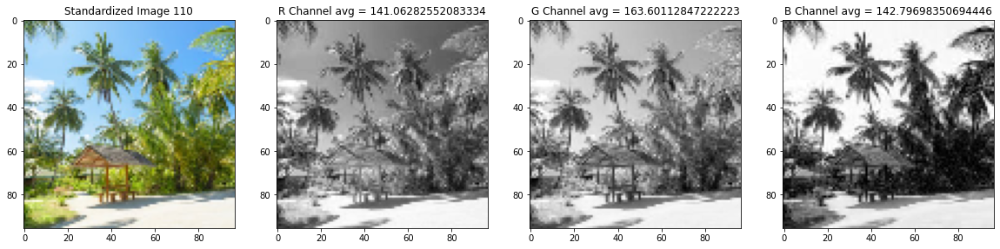

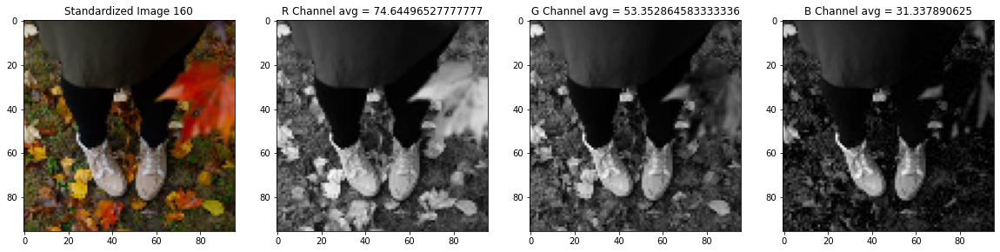

In [276]:
# one source of truth for our image choice
img_choice = 10
offset = 50 # each season contains 50 images, so the offset for each season is 50
# color_space = 41 # HSV
# color_space = 44 # Lab
# color_space = 83 # YUV
color_space = 0 # RGB

cvt_sample_imgs(img_choice, color_space) # Winter
cvt_sample_imgs(img_choice + offset, color_space) # Spring
cvt_sample_imgs(img_choice + offset * 2, color_space) # Summer
cvt_sample_imgs(img_choice + offset * 3, color_space) # Fall

In [277]:
import random

# Let's define a function that can show color conversion samples from any season.
def season_cvt_samples(season = 0):
    # season index: 0 = winter, 1 = spring, 2 = summer, 3 = fall
    index = random.randrange(0, 49)
    if season == 1:
        index = random.randrange(50, 99)
    elif season == 2:
        index = random.randrange(100, 149)
    elif season == 3:
        index = random.randrange(150, 199)

    # cvt_sample_imgs(index, 33) # XYZ - Not suitable
    # cvt_sample_imgs(index, 37) # YCrCb
    cvt_sample_imgs(index, 41) # HSV
    cvt_sample_imgs(index, 44) # Lab
    # cvt_sample_imgs(index, 51) # Luv
    # cvt_sample_imgs(index, 53) # HLS
    cvt_sample_imgs(index, 83) # YUV
    cvt_sample_imgs(index, 0)

### 0. Winter samples

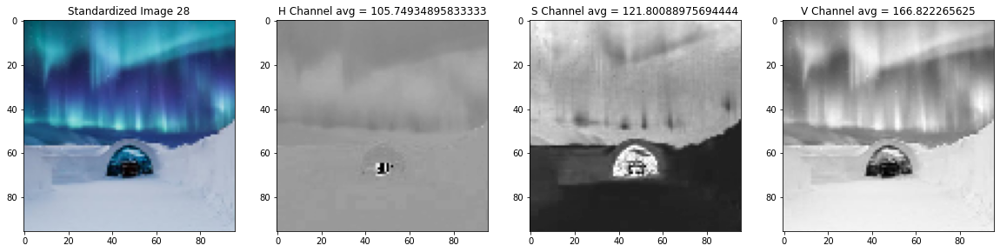

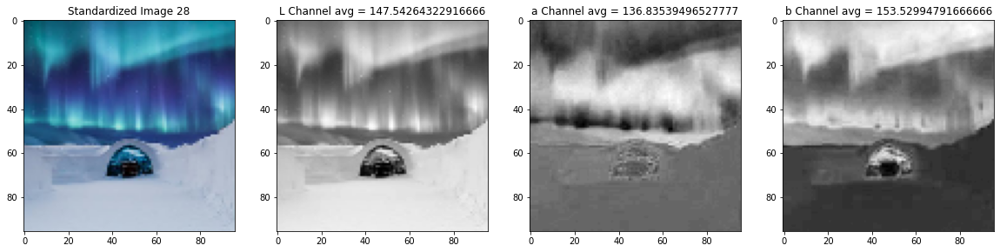

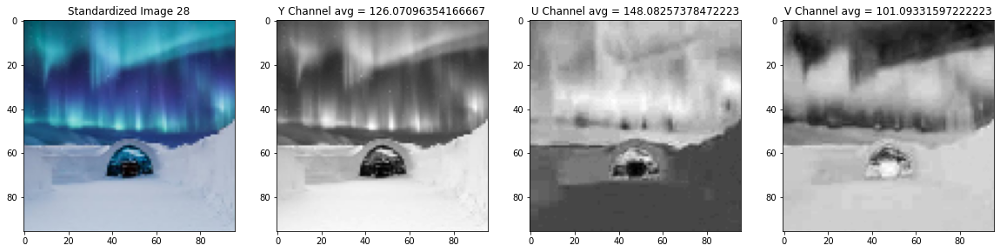

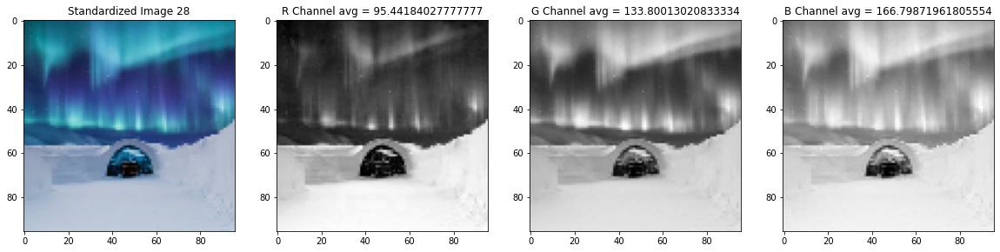

In [278]:
season_cvt_samples(0)

### 1. Spring samples

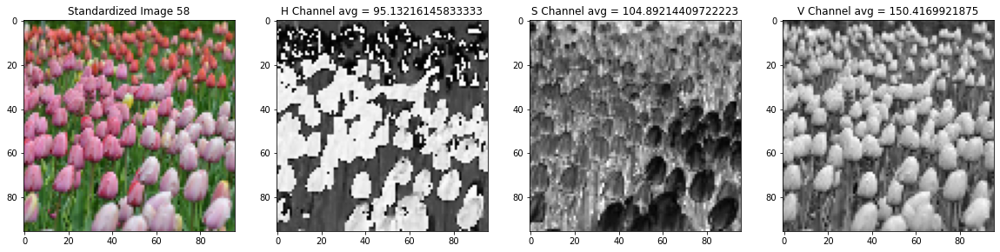

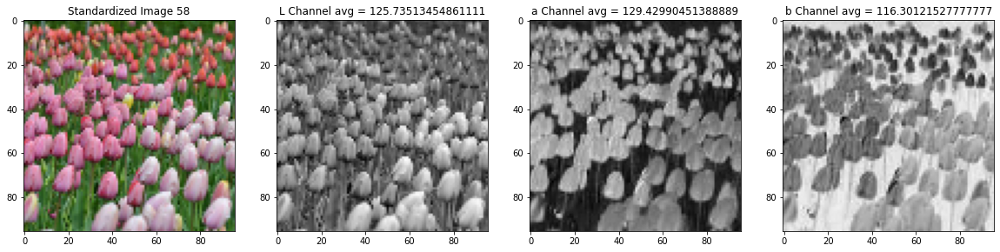

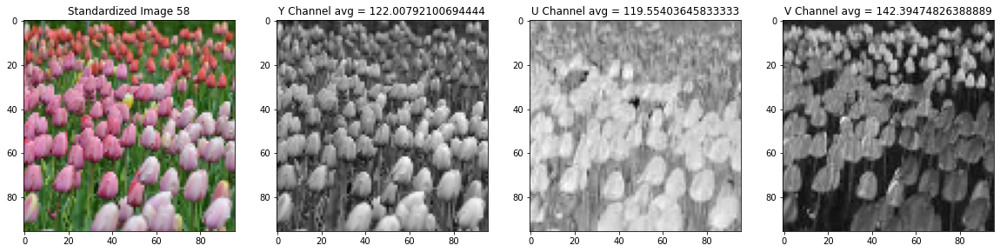

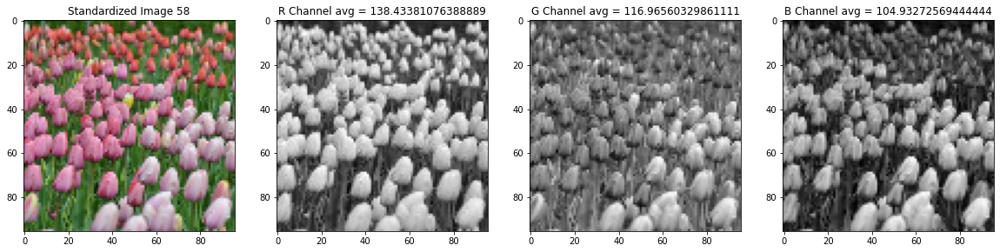

In [279]:
season_cvt_samples(1)

### 2. Summer samples

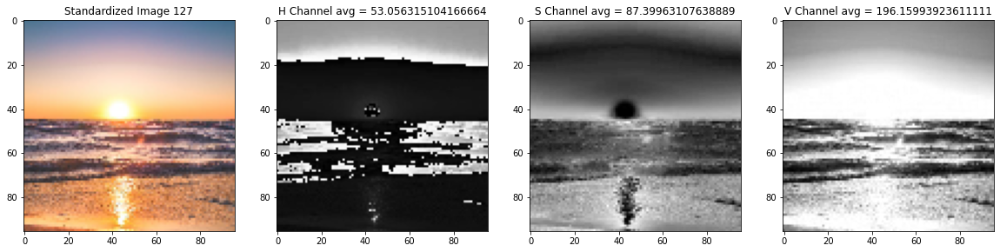

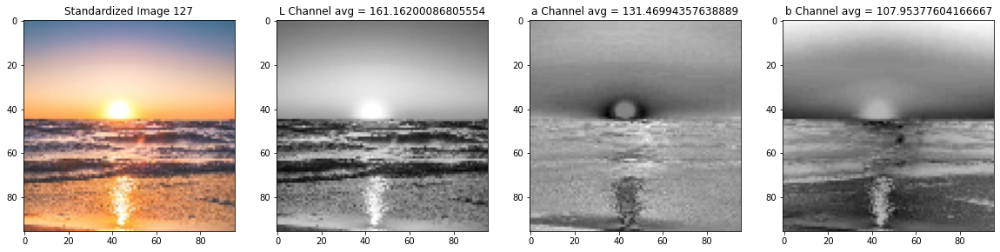

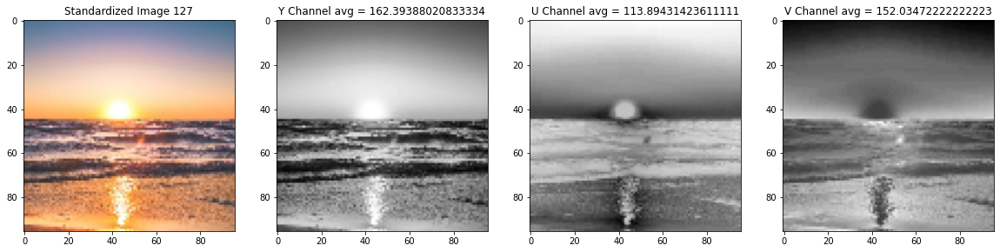

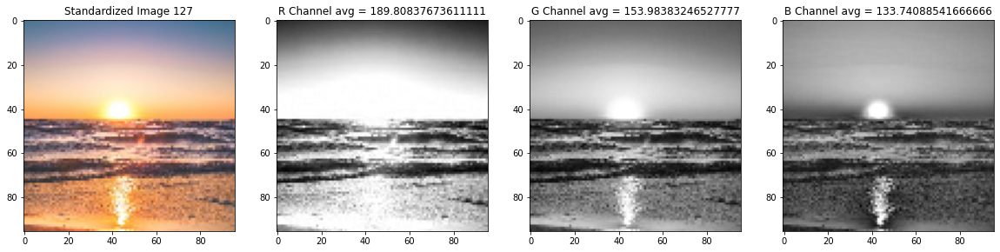

In [280]:
season_cvt_samples(2)

### 3. Fall samples

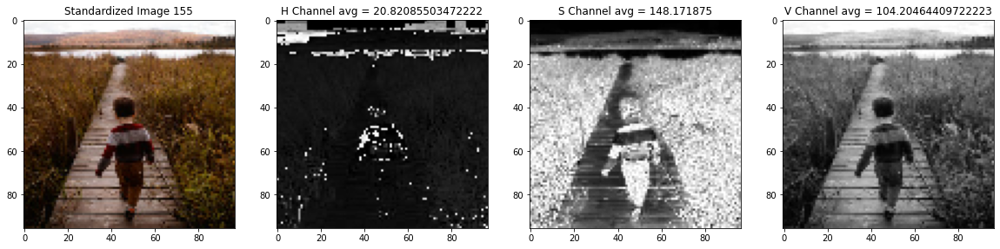

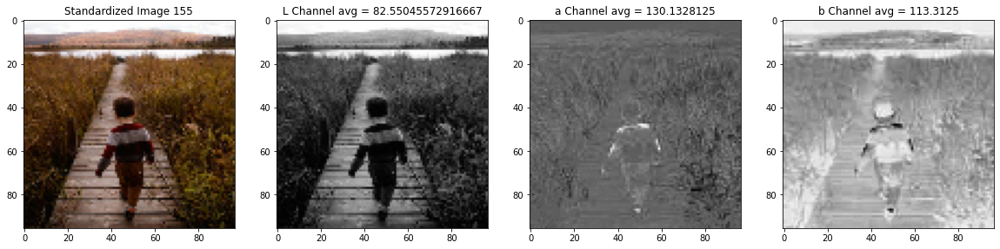

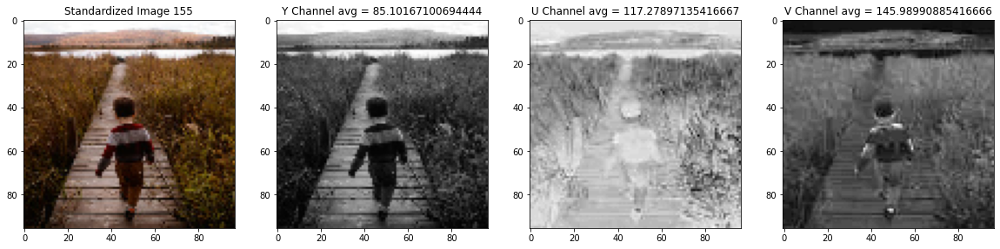

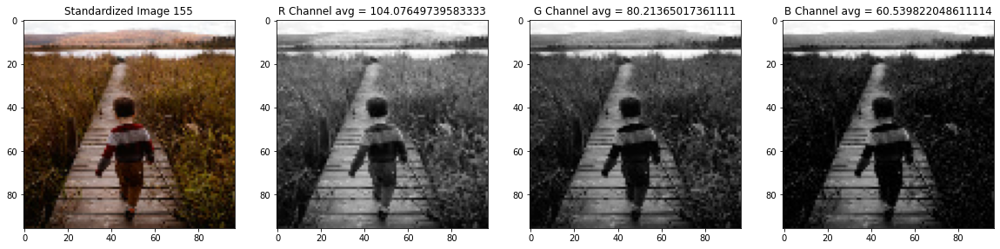

In [281]:
season_cvt_samples(3)

## Average each channel for each season *for every image*

Now that we've done a lot of processing, chosen a few color channels to focus on, and tried to search out a few patterns, let's find the average value for EVERY channel over EVERY image in each category. Basically, in order to do this, we need to do X things, and we can use some previously defined functions to do so:

1. Determine which season we are "in"
2. Starting at the beginning of that season's images, loop through the entire 50 image set
3. Read in an image
4. Convert it to the appropriate color space (there are 4)
5. Split image into 3 color channels
6. Get the average for each channel (`get_channel_avg(channel)`)
7. Keep a running total of the average for each channel
8. Return the averages for each channel (and print them)

In [316]:
# Pretty up our dicts and arrays when printed
import pprint

def every_image_channel_avg(season):
    if isinstance(season, str):
        if season == 'winter':
            season = 0
        elif season == 'spring':
            season = 1
        elif season == 'summer':
            season = 2
        elif season == 'fall':
            season = 3
    
    season_start = season * 50
    season_range = season * 50 + 49
    
    rgb = {'rgb': [], 'max': [], 'min': []}
    hsv = {'hsv': [], 'max': [], 'min': []}
    lab = {'lab': [], 'max': [], 'min': []}
    yuv = {'yuv': [], 'max': [], 'min': []}

    for item in range(season_start, season_range):
        image = STD_LIST[item][0]
        label = STD_LIST[item][1]
        
        # The image is currently in RGB color, so we can start here before converting it
        ## RGB color space
        r, g, b = image[:,:,0], image[:,:,1], image[:,:,2]
        r_av = get_channel_avg(r)
        g_av = get_channel_avg(g)
        b_av = get_channel_avg(b)
        
        if item == season_start: # this is the first item, set all the values now
            rgb['rgb'] = [r_av,g_av,b_av]
            rgb['max'] = [r_av,g_av,b_av]
            rgb['min'] = [r_av,g_av,b_av]
        else:
            # Averages first
            rgb['rgb'] = [rgb['rgb'][0] + (r_av - rgb['rgb'][0]) / item,
                          rgb['rgb'][1] + (g_av - rgb['rgb'][1]) / item,
                          rgb['rgb'][2] + (b_av - rgb['rgb'][2]) / item]
            # Max second
            rgb['max'] = [max(rgb['max'][0], r_av), max(rgb['max'][1], g_av), max(rgb['max'][2], b_av)]
            rgb['min'] = [min(rgb['min'][0], r_av), min(rgb['min'][1], g_av), min(rgb['min'][2], b_av)]
            
        
        ## HSV color space, 41
        hsv_img = np.copy(image)
        hsv_img = cv2.cvtColor(hsv_img, 41)
        
        h, s, v = hsv_img[:,:,0], hsv_img[:,:,1], hsv_img[:,:,2]
        h_av = get_channel_avg(h)
        s_av = get_channel_avg(s)
        v_av = get_channel_avg(v)
        
        if item == season_start: # this is the first item, set all the values now
            hsv['hsv'] = [h_av,s_av,v_av]
            hsv['max'] = [h_av,s_av,v_av]
            hsv['min'] = [h_av,s_av,v_av]
        else:
            # Averages first
            hsv['hsv'] = [hsv['hsv'][0] + (h_av - hsv['hsv'][0]) / item,
                          hsv['hsv'][1] + (s_av - hsv['hsv'][1]) / item,
                          hsv['hsv'][2] + (v_av - hsv['hsv'][2]) / item]
            # Max second
            hsv['max'] = [max(hsv['max'][0], h_av), max(hsv['max'][1], s_av), max(hsv['max'][2], v_av)]
            hsv['min'] = [min(hsv['min'][0], h_av), min(hsv['min'][1], s_av), min(hsv['min'][2], v_av)]
        
        
        ## Lab color space, 44
        lab_img = np.copy(image)
        lab_img = cv2.cvtColor(lab_img, 44)
        
        l, a, b = lab_img[:,:,0], lab_img[:,:,1], lab_img[:,:,2]
        l_av = get_channel_avg(l)
        a_av = get_channel_avg(a)
        b_av = get_channel_avg(b)
        
        if item == season_start: # this is the first item, set all the values now
            lab['lab'] = [l_av,a_av,b_av]
            lab['max'] = [l_av,a_av,b_av]
            lab['min'] = [l_av,a_av,b_av]
        else:
            # Averages first
            lab['lab'] = [lab['lab'][0] + (l_av - lab['lab'][0]) / item,
                          lab['lab'][1] + (a_av - lab['lab'][1]) / item,
                          lab['lab'][2] + (b_av - lab['lab'][2]) / item]
            # Max second
            lab['max'] = [max(lab['max'][0], l_av), max(lab['max'][1], a_av), max(lab['max'][2], b_av)]
            lab['min'] = [min(lab['min'][0], l_av), min(lab['min'][1], a_av), min(lab['min'][2], b_av)]
            
        
        ## YUV color space, 83
        yuv_img = np.copy(image)
        yuv_img = cv2.cvtColor(yuv_img, 44)
        
        y, u, v = yuv_img[:,:,0], yuv_img[:,:,1], yuv_img[:,:,2]
        y_av = get_channel_avg(y)
        u_av = get_channel_avg(u)
        v_av = get_channel_avg(v)
        
        if item == season_start: # this is the first item, set all the values now
            yuv['yuv'] = [y_av,u_av,v_av]
            yuv['max'] = [y_av,u_av,v_av]
            yuv['min'] = [y_av,u_av,v_av]
        else:
            # Averages first
            yuv['yuv'] = [yuv['yuv'][0] + (y_av - yuv['yuv'][0]) / item,
                          yuv['yuv'][1] + (u_av - yuv['yuv'][1]) / item,
                          yuv['yuv'][2] + (v_av - yuv['yuv'][2]) / item]
            # Max second
            yuv['max'] = [max(yuv['max'][0], y_av), max(yuv['max'][1], u_av), max(yuv['max'][2], v_av)]
            yuv['min'] = [min(yuv['min'][0], y_av), min(yuv['min'][1], u_av), min(yuv['min'][2], v_av)]
        
    pprint.pp(hsv)
    pprint.pp(lab)
    pprint.pp(yuv)
    pprint.pp(rgb)
    
    return {'hsv': hsv, 'lab': lab, 'yuv': yuv, 'rgb': rgb}

print('Winter Averages:')
winter_avg = every_image_channel_avg(0)
print()

print('Spring Averages:')
spring_avg = every_image_channel_avg(1)
print()

print('Summer Averages:')
summer_avg = every_image_channel_avg(2)
print()

print('Fall Averages:')
fall_avg = every_image_channel_avg(3)

Winter Averages:
{'hsv': [91.48414216218171, 58.6743118851273, 161.9383997034144],
 'max': [121.63357204861111, 208.96647135416666, 237.72482638888889],
 'min': [0.0, 0.0, 51.6142578125]}
{'lab': [154.2762609411169, 131.14548068576386, 135.8167815031828],
 'max': [238.39171006944446, 148.25651041666666, 181.06651475694446],
 'min': [38.541666666666664, 125.75336371527777, 119.61002604166667]}
{'yuv': [154.2762609411169, 131.14548068576386, 135.8167815031828],
 'max': [238.39171006944446, 148.25651041666666, 181.06651475694446],
 'min': [38.541666666666664, 125.75336371527777, 119.61002604166667]}
{'rgb': [135.4187915943287, 147.0003616898148, 158.41411901403356],
 'max': [232.86328125, 236.13726128472223, 237.72309027777777],
 'min': [16.21234809027778, 34.806857638888886, 45.336154513888886]}

Spring Averages:
{'hsv': [73.36261913619616, 109.17230349170919, 166.16831530789398],
 'max': [171.49045138888889, 243.5791015625, 247.93012152777777],
 'min': [16.365342881944443, 27.326171875,

### Find each channel's standard deviation for each season

Finding the standard deviation may help us to determine which types of images have large or small variation in their average data values of their color channels. This may help us to single out one or more characteristics that make it easier to classify certain types of images more quickly.

For example, if Fall images *always* have muted colors within a certain range, it will be easier to pick those out from the start. 

If Winter images *almost always* have color values along the RGB spectrum that are have little variance (i.e. the images are mostly white and black, with little bright colors that stand out), then it will be easier to pick those out and label them quickly as well. 

Once we have one or two features that are easy to find, and therefore classify, we will have less features we need to look for later, by the process of elimination.

In [385]:
import statistics

seasons_avgs = [winter_avg, spring_avg, summer_avg, fall_avg]
color_spaces = ['hsv', 'lab', 'yuv', 'rgb']
measurements = ['max', 'min']
seasons_stdev = []

# Print all our values in an easy to read format
for season in seasons_avgs:
    if season == seasons_avgs[0]:
        print('***WINTER***')
    elif season == seasons_avgs[1]:
        print('***SPRING***')
    elif season == seasons_avgs[2]:
        print('***SUMMER***')
    elif season == seasons_avgs[3]:
        print('***FALL***')
    
    # Loop through each color space
    i = 0 # since we're using objects (a dict), i is for keeping track of which color_space we want
    for color_space in season:
        print(color_spaces[i])
        
        for j in range(0, 3): # j is for keeping track of which channel we want
            zero = season[color_space][color_spaces[i]][j]
            one = season[color_space]['max'][j]
            two = season[color_space]['min'][j]
            
            print('{} stdev: {}'.format(color_spaces[i][j], statistics.stdev([zero, one, two])))
        
        i += 1
        
    print()

***WINTER***
hsv
h stdev: 63.34174800099808
s stdev: 107.77862668704473
v stdev: 93.58787536280734
lab
l stdev: 100.34103924618285
a stdev: 11.749140928449997
b stdev: 31.851471152148875
yuv
y stdev: 100.34103924618285
u stdev: 11.749140928449997
v stdev: 31.851471152148875
rgb
r stdev: 108.50747407138762
g stdev: 100.88500107615265
b stdev: 96.68615208586671

***SPRING***
hsv
h stdev: 78.46608636040092
s stdev: 109.18585548403911
v stdev: 75.08319610476845
lab
l stdev: 71.75850900803287
a stdev: 55.86531010561251
b stdev: 47.501699234727106
yuv
y stdev: 71.75850900803287
u stdev: 55.86531010561251
v stdev: 47.501699234727106
rgb
r stdev: 92.80279225844849
g stdev: 95.2005695660444
b stdev: 111.51413433800504

***SUMMER***
hsv
h stdev: 45.92075484373171
s stdev: 101.88474030366964
v stdev: 81.47447873776201
lab
l stdev: 82.22592363099253
a stdev: 18.88999214829079
b stdev: 51.55096773922775
yuv
y stdev: 82.22592363099253
u stdev: 18.88999214829079
v stdev: 51.55096773922775
rgb
r stdev

### Unique characteristics of our images (by season)

Understanding the unique features of each season (as determined by our previous calculations using various color channels) will help us build our Classifier in the next section.

* Winter:
    - HSV: Relatively low saturation (≈ 60, < 100)
    - HSV: Average Hue = yellow-green (≈ 90)
    - YUV: Low variance between B / R channels
    - RGB: Slightly more blue than red
* Spring:
    - RGB: Red channel has a slightly higher value than either Blue or Green
* Summer:
    - HSV: Low data variance in Hue (≈ 70)
    - Lab: Highest average luminosity (≈ 180)
    - YUV: Low variance in Blue channel
    - RGB: Red and Green values are high
* Fall:
    - HSV: Lowest brightness (≈ 100)
    - HSV: Low variance in Hue = orange (≈ 30)
    - YUV: Low variance in Blue / Red channels
    - RGB: All color values are muted (near or < 100)

---
# 5. Classification

Now, let's turn our feature extractors into classifiers that take in a standardized image and return a `predicted_lbl` for that image. The `estimate_lbl()` function should return a value: 0, 1, 2, or 3 (spring, summer, fall, winter).

In [410]:
def get_averages(rgb_image):
    r,g,b = rgb_image[:,:,0], rgb_image[:,:,1], rgb_image[:,:,2]
    r,g,b = get_channel_avg(r), get_channel_avg(g), get_channel_avg(b)
    
    # HSV, 41
    hsv_image = np.copy(rgb_image)
    hsv_image = cv2.cvtColor(hsv_image, 41)
    h,s,v = hsv_image[:,:,0], hsv_image[:,:,1], hsv_image[:,:,2]
    h,s,v = get_channel_avg(h), get_channel_avg(s), get_channel_avg(v)
    
    # Lab, 44
    lab_image = np.copy(rgb_image)
    lab_image = cv2.cvtColor(lab_image, 44)
    l,a,bb = lab_image[:,:,0], lab_image[:,:,1], lab_image[:,:,2]
    l,a,bb = get_channel_avg(l), get_channel_avg(a), get_channel_avg(bb)
    
    # YUV, 83
    yuv_image = np.copy(rgb_image)
    yuv_image = cv2.cvtColor(yuv_image, 83)
    y,u,v = yuv_image[:,:,0], yuv_image[:,:,1], yuv_image[:,:,2]
    y,u,v = get_channel_avg(y), get_channel_avg(u), get_channel_avg(v)
    
    return {'hsv': [h,s,v], 'lab': [l,a,bb], 'yuv': [y,u,v], 'rgb': [r,g,b]}

In [460]:
# This function takes in an RGB input image and attempts to estimate the correct Season label
# based on various color conversions, thresholds, and weightings
def estimate_label(rgb_image):
    
    brightness = avg_brightness(rgb_image)
    
    averages = get_averages(rgb_image)
    
    # Weight the values above and perform a calculation on the data
    img_weight = 0
    
    # We'll use these values to add points if the images matches certain criteria.
    # Then, we may predict the label based on the max of these values.
    winter = 0
    spring = 0
    summer = 0
    fall = 0
    
    predicted_label = 4 # unclassified
    
    # Hue
    if averages['hsv'][0] < 40:
        predicted_label = 3
    elif averages['hsv'][0] < 70:
        predicted_label = 2
    elif averages['hsv'][0] < 100:
        predicted_label = 0
    else:
        predicted_label = 1
        
    # Saturation
    if averages['hsv'][1] < 100:
        predicted_label = 0
#     elif averages['hsv'][2] < 100:
#         predicted_label = 3
#     elif averages['hsv'][2] > 160:
#         predicted_label = 2
    
        
    # Brightness
    if averages['hsv'][2] < 100:
        fall += 1
        
    # Checking RGB for fall
    if averages['rgb'][0] < 100 and averages['rgb'][1] < 100 and averages['rgb'][2] < 100:
        fall += 1
        
    # Checking YUV for winter
    if averages['yuv'][1] > averages['yuv'][2]:
        winter += 1
        
    # Checking RGB for summer
    if averages['rgb'][0] > 150 and averages['rgb'][1] > 150:
        summer += 2 # weighted value
        
    # Checking RGB for spring (only one check, so perhaps this is the least likely outcome...)
    if averages['rgb'][0] > averages['rgb'][1] and averages['rgb'][0] > averages['rgb'][1]:
        spring += 4 # weighted value since this is our only check for spring right now...
        
    # Create dict
    season = {0: winter, 1: spring, 2: summer, 3: fall}
    # predicted_label = max(season)
    
    return predicted_label

### Testing the Classifier

Now, let's test this classification algorithm against our Test Data that we set aside at the beginning of the notebook. Because our classifier currently is pretty simple, we shouldn't expect 100% accuracy, but let's shoot for between 75-85% accuracy.

1. Standardize the Test data like we did the training data
2. Shuffle it (to ensure order does not play a role in testing accuracy)
3. Visualize the Test data
4. Determine the Accuracy

TEST Shape: (96, 96, 3)
TEST Label [0 = winter, 1 = spring, 2 = summer, 3 = fall]: 1


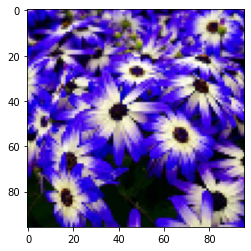

In [424]:
# Load testing data
IMG_TEST_LIST = load_data(img_test)

# Standardize testing data
STD_TEST_LIST = standardize_list(IMG_TEST_LIST)

# Shuffle the standardized testing data
random.shuffle(STD_TEST_LIST)

# Visualize the testing data
# Display a STD_LIST image and label

# Select an image and its label by list index
test_idx = random.randint(0, len(STD_TEST_LIST))
selected_test_img = STD_TEST_LIST[test_idx][0]
selected_test_lbl = STD_TEST_LIST[test_idx][1]

print("TEST Shape: " + str(selected_test_img.shape))
print("TEST Label [0 = winter, 1 = spring, 2 = summer, 3 = fall]: " + str(selected_test_lbl))

# Show selected sample image
plt.imshow(selected_test_img)

---
# 6. Determining Accuracy and Visualizing Error

### Determine the Accuracy

Compare the output of our Classification algorithm (our "model") with the true labels and determine the accuracy. 

Then, store all misclassified images, their predicted labels, and their true labels, in a list called `misclassified`.

In [425]:
# Construct a list of misclassified images given a list of Test images and their labels
def get_misclassified_images(img_list):
    # Track misclassified images by placing them in a list
    misclassified_images_labels = []
    
    # Iterate through the test images
    # Classify each and compare to the true label
    for image in img_list:
        
        # Get true data
        img = image[0]
        lbl = image[1]
        
        # Get predicted label
        predicted_label = estimate_label(img)
        
        # Compare true and predicted labels
        if predicted_label != lbl:
            # If they aren't the same, the image has been misclassified
            misclassified_images_labels.append((img, predicted_label, lbl))
            
    # Return the list of misclassified images
    return misclassified_images_labels

In [461]:
# Find all misclassified images in a given test set
MISCLASSIFIED = get_misclassified_images(STD_TEST_LIST)

# Calculate accuracy
total = len(STD_TEST_LIST)
correct = total - len(MISCLASSIFIED)
accuracy = correct / total

print('Classifier accuracy: ' + str(accuracy))
print("Number of misclassified images = ", str(len(MISCLASSIFIED)), " out of ", str(total))

Classifier accuracy: 0.45
Number of misclassified images =  44  out of  80


### Visualize misclassified images

It's important to take a look at some of the images our Classifier misclassified in order to determine WHY they were misclassified. What did the algorithm calculate that doesn't fit in this image? Are there any weaknesses in the classification algorithm?

Image classified as:  0
Correct classification:  3


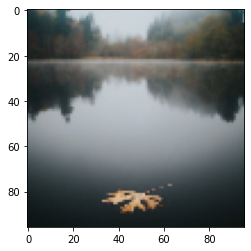

In [462]:
# Visualize misclassified example(s)
idx = random.randrange(0, len(MISCLASSIFIED))
mis_img = MISCLASSIFIED[idx][0]
mis_pred = MISCLASSIFIED[idx][1]
mis_lbl = MISCLASSIFIED[idx][2]

print('Image classified as: ', mis_pred)
print('Correct classification: ', mis_lbl)

plt.imshow(mis_img)

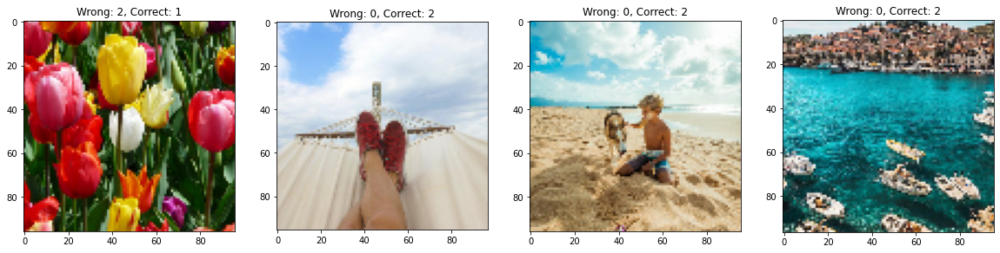

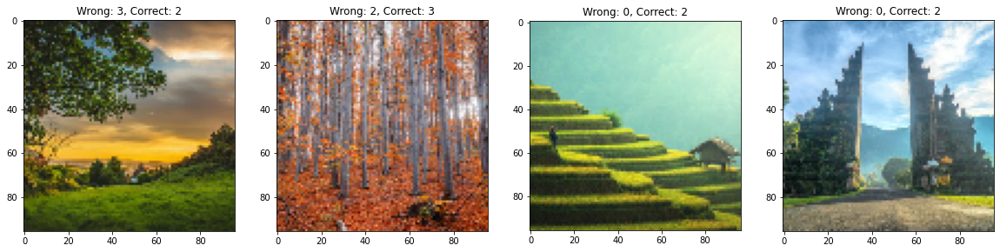

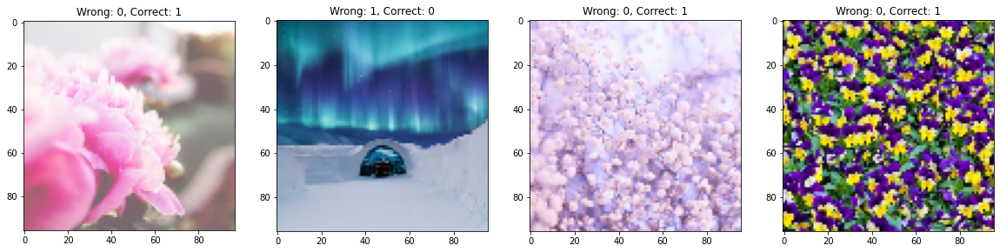

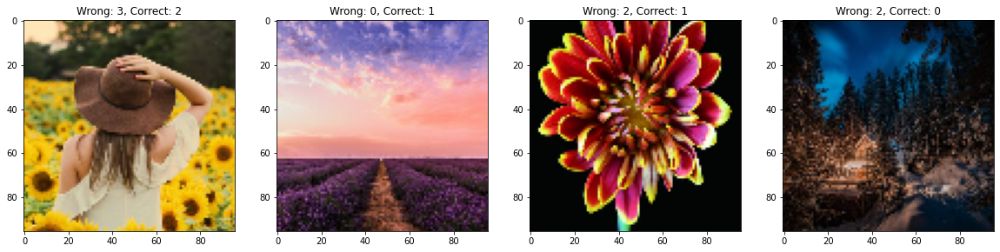

In [463]:
# Visualize a 4x4 grid of misclassified examples
def misclassified_grid():
    i, j = 0, 0
    while j < 4:
        # Plot multiple misclassified images
        f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (20, 10))
        ax1.set_title('Wrong: {}, Correct: {}'.format(MISCLASSIFIED[i][1], MISCLASSIFIED[i][2]))
        ax1.imshow(MISCLASSIFIED[i][0])
        ax2.set_title('Wrong: {}, Correct: {}'.format(MISCLASSIFIED[i+1][1], MISCLASSIFIED[i+1][2]))
        ax2.imshow(MISCLASSIFIED[i+1][0])
        ax3.set_title('Wrong: {}, Correct: {}'.format(MISCLASSIFIED[i+2][1], MISCLASSIFIED[i+2][2]))
        ax3.imshow(MISCLASSIFIED[i+2][0])
        ax4.set_title('Wrong: {}, Correct: {}'.format(MISCLASSIFIED[i+3][1], MISCLASSIFIED[i+3][2]))
        ax4.imshow(MISCLASSIFIED[i+3][0])
        i += 4
        j += 1

misclassified_grid()

---
# 7. Improving the algorithm and Future Research

Now, it may be time to improve the algorithm. What can be improved upon?

* Tweak the thresholds or weighted values so the accuracy is better.
* Add another feature that tackles a weakness.

### Future Research

This project illustrated how various color channels, color conversions, and pattern recognition on the part of a human programmer may be used to help develop an algorithm to classify images by season. However, there are various weaknesses inherent in this approach. Namely, that only color channels, such as Hue, Lightness, Red, Blue, and various combinations are used to classify images. This project does not take into account any sort of edge detection, or pixel gradient variation to help it classify images.

For future research, various types of Neural Networks, such as CNNs and RNNs will be explored. Using a combination of data augmentation, convolutional layers, max pooling layers, batch normalization, dropout, and softmax layers, we will attempt to create better models that are able to classify images more accurately and within a faster time frame.

Additionally, it would be interesting to compare the accuracy rate and speed of various Neural Network architectures.